In [1]:
import math
import numpy as np
from pylab import cm
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

In C:\Users\sning\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\sning\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\sning\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In C:\Users\sning\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\sning\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mpl

In [6]:
data_4D=np.load('D:4DSTEM.npy')
#data_4D= data_4D[64:192,64:192,:,:]

In [8]:
def circle(x0,y0,ridius):
    phi=np.pi*(np.linspace(-1,1,200))
    x=x0+ridius*np.cos(phi)
    y=y0+ridius*np.sin(phi)
    return x,y
def FFT_2D (array):
    result=np.fft.fft2(array)
    result=np.fft.fftshift(result)
    return result
def IFFT_2D (array):
    result=np.fft.ifftshift(array)
    result=np.fft.ifft2(result)
    return result

In [9]:
data_4D_Reciprocal=np.zeros(data_4D.shape,dtype=complex)
for i in range (data_4D.shape[2]):
    for j in range (data_4D.shape[3]):
        data_4D_Reciprocal[:,:,i,j]=FFT_2D(data_4D[:,:,i,j])

In [10]:
power_spectra =np.zeros((data_4D.shape[0],data_4D.shape[1]))
for i in range (data_4D.shape[0]):
    for j in range (data_4D.shape[1]):
        g=data_4D_Reciprocal[i,j,:,:]
        power_spectra[i,j]=np.sum(g*np.conjugate(g)).real

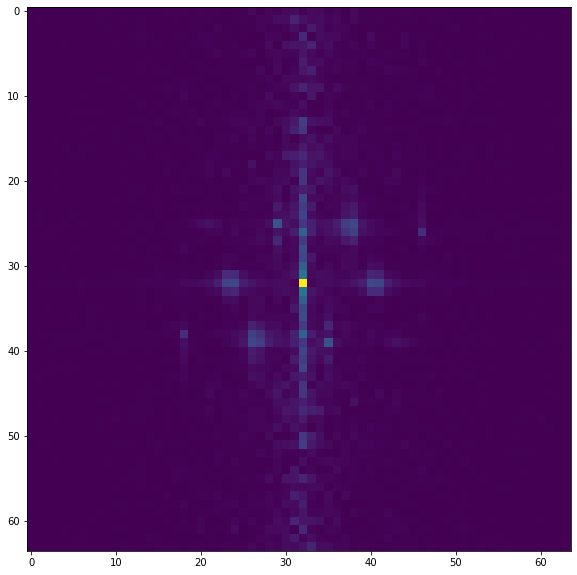

In [12]:
fig =plt.figure(1, figsize=(10, 10))
grid=ImageGrid(fig, 111, nrows_ncols=(1,1),
             axes_pad=0.5,
             share_all=True,
             cbar_location="right",
             cbar_mode="share",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.log(power_spectra+0.1))

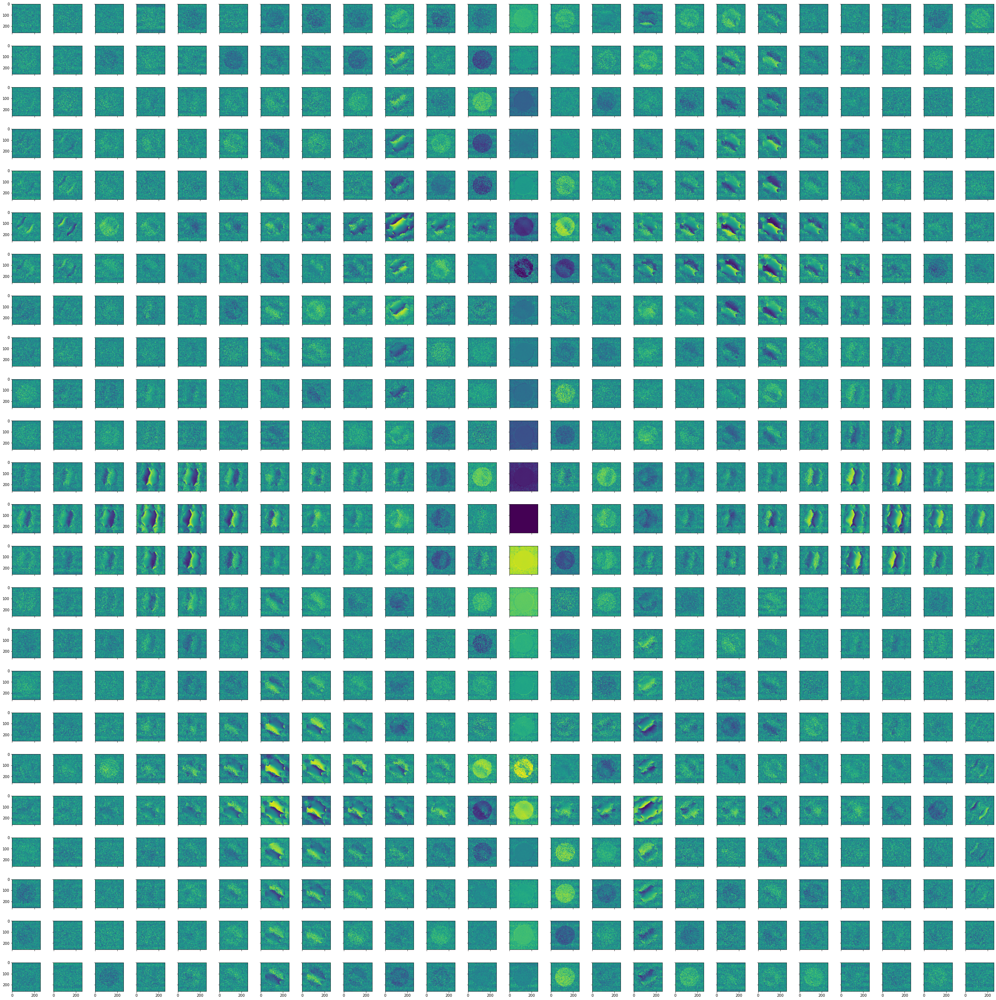

In [15]:
fig =plt.figure(1, figsize=(50, 50))
grid=ImageGrid(fig, 111, nrows_ncols=(24,24),
             axes_pad=0.5,
             share_all=True,
             cbar_location="right",
             cbar_mode="share",
             cbar_size="5%",
             cbar_pad="2%")

for i in range(24):
    for j in range(24):
        frame_idx = 24*i+j;
        single_trotter=data_4D_Reciprocal[i+32-12,j+32-12,:,:]
        im=grid[frame_idx].imshow(np.angle(single_trotter))

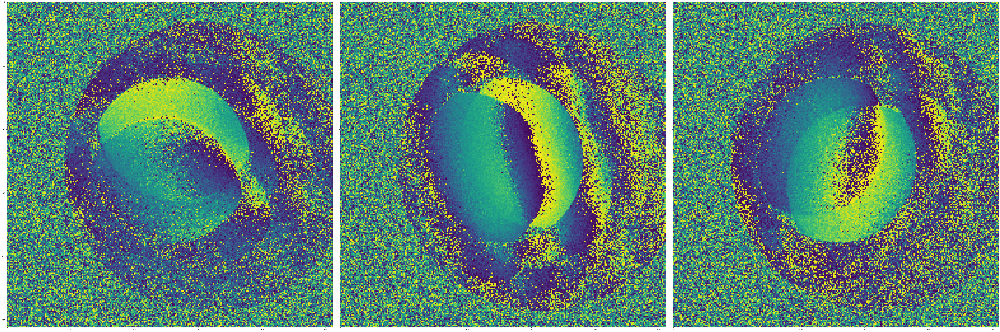

In [8]:
fig =plt.figure(1, figsize=(90, 30))
grid=ImageGrid(fig, 111, nrows_ncols=(1,3),
             axes_pad=0.5,
             share_all=True,
             cbar_location="right",
             cbar_mode="share",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.angle(data_4D_Reciprocal[8+64,3+64,:,:]))
im=grid[1].imshow(np.angle(data_4D_Reciprocal[1+64,9+64,:,:]))
im=grid[2].imshow(np.angle(data_4D_Reciprocal[-7+64,6+64,:,:]))

In [9]:
#get the averaged CBED patterns.
pacbed = np.average(data_4D, axis=(0,1))
pacbed[245, 25]=0
thresh = np.max(pacbed)*0.3
BFdisk = pacbed > thresh
BFdisk[120, 132] = 1
mpacbed = pacbed * BFdisk
X, Y = np.meshgrid(np.arange(0, pacbed.shape[1]), np.arange(0, pacbed.shape[0]))
x_center, y_center =np.average(mpacbed * X), np.average(mpacbed * Y)
x_center/=np.average(mpacbed)
y_center/=np.average(mpacbed)
print(x_center)
print(y_center)

128.08597193056252
124.0607353445549


In [10]:
#get the edge of bright field apertuer and fit the radius in pixels. 
grad=np.sqrt(np.sum(np.square(np.abs(np.gradient(pacbed))), axis =0))
edge = grad > np.max(grad)*0.5
radius = np.average(np.sqrt((X - x_center) ** 2 + (Y - y_center) ** 2)[edge])
print(radius)

62.40275290262675


C:\Users\sning\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  


Text(0.5, 1.0, 'side bands')

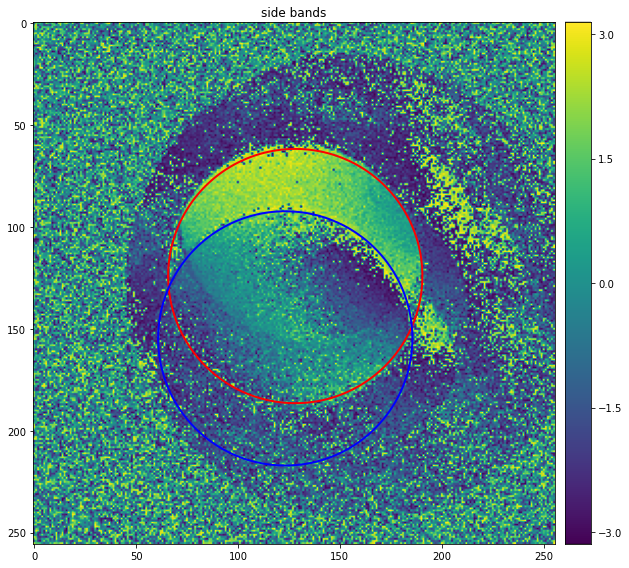

In [14]:
#Here we need to consider the coordinate difference in imshow. The scan y angle should be opposite.
round1=circle(x_center, y_center, radius)
rot_angle = 1.73
round2=circle(x_center+31*math.cos(rot_angle), y_center+math.sin(rot_angle)*31, radius)
fig =plt.figure(1, figsize=(10, 10))
grid=ImageGrid(fig, 111, nrows_ncols=(1,1),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.angle(data_4D_Reciprocal[8+64,3+64,:,:]))
grid.cbar_axes[0].colorbar(im)
grid[0].plot(round1[0],round1[1], linewidth=2, color = 'red')
grid[0].plot(round2[0],round2[1], linewidth=2, color = 'blue')
grid[0].set_title('side bands')

C:\Users\sning\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  


Text(0.5, 1.0, 'side bands')

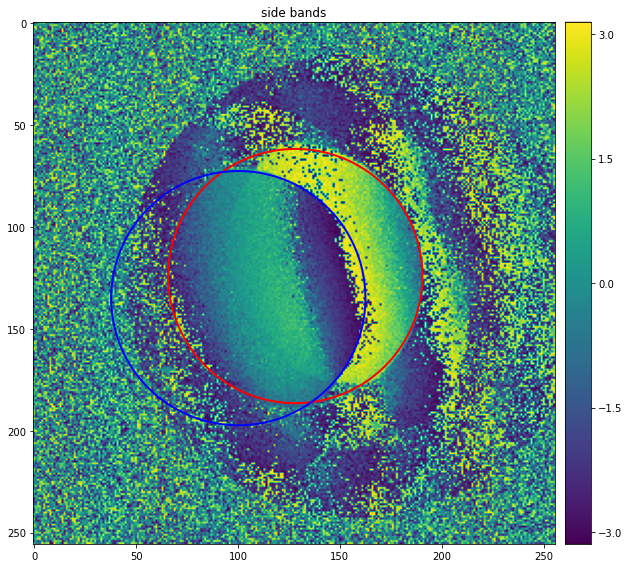

In [19]:
#Here we need to consider the coordinate difference in imshow. The scan y angle should be opposite.
round1=circle(x_center, y_center, radius)
rot_angle = -0.37
round2=circle(x_center-30*math.cos(rot_angle), y_center-30*math.sin(rot_angle), radius)
fig =plt.figure(1, figsize=(10, 10))
grid=ImageGrid(fig, 111, nrows_ncols=(1,1),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.angle(data_4D_Reciprocal[1+64,9+64,:,:]))
grid.cbar_axes[0].colorbar(im)
grid[0].plot(round1[0],round1[1], linewidth=2, color = 'red')
grid[0].plot(round2[0],round2[1], linewidth=2, color = 'blue')
grid[0].set_title('side bands')

C:\Users\sning\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Since 3.2, mpl_toolkits's own colorbar implementation is deprecated; it will be removed two minor releases later.  Set the 'mpl_toolkits.legacy_colorbar' rcParam to False to use Matplotlib's default colorbar implementation and suppress this deprecation warning.
  


Text(0.5, 1.0, 'side bands')

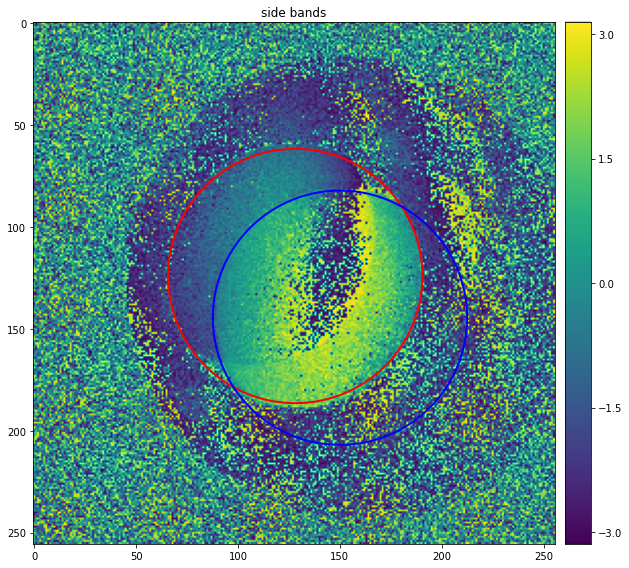

In [22]:
#Here we need to consider the coordinate difference in imshow. The scan y angle should be opposite.
round1=circle(x_center, y_center, radius)
rot_angle = 0.75
round2=circle(x_center+30*math.cos(rot_angle), y_center+30*math.sin(rot_angle), radius)
fig =plt.figure(1, figsize=(10, 10))
grid=ImageGrid(fig, 111, nrows_ncols=(1,1),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.angle(data_4D_Reciprocal[-7+64,6+64,:,:]))
grid.cbar_axes[0].colorbar(im)
grid[0].plot(round1[0],round1[1], linewidth=2, color = 'red')
grid[0].plot(round2[0],round2[1], linewidth=2, color = 'blue')
grid[0].set_title('side bands')

In [14]:
#list equations to solve the rotation angle and x/y ratio